In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
from wordcloud import WordCloud

from ydata_profiling import ProfileReport

%matplotlib inline

pd.options.mode.chained_assignment = None  # default='warn'

# your code that triggers the warning goes here

pd.options.mode.chained_assignment = 'warn'  # set it back to the default value

In [2]:
# Specifying data types for columns while reading a CSV file
dtype_dict = {
    "number": "str",
    "closed": "str", 
    "case": "str",
    "description": "str",
    "case_type": "category",
    "due_date": "str", 
    "first_response_time": "str", 
    "opened": "str",  
    "account": "category",
    "contact": "category",
    "created_by": "category",
    "business_service": "category",
    "business_service_activity": "category",
    "assigned_to": "category",
    "assignment_group": "category",
    "auto_close": "category",
    "time_worked": "float",
    "reassignment_count": "int",
    "impact": "category",
    "priority": "category",
    "urgency": "category",
    "escalation": "category",
    "comments": "str",
    "case_cause": "category",
    "cause": "str",
    "close_notes": "str",
    "resolution_code": "category",
    "problem": "category",
    "business_percentage": "float",
    "sla_has_breached": "category",
    "duration": "float",
    "openedToClosed": "float",
    "created_by_group": "category",
    "cluster": "int" 
}

# read csv file into dataframe
df1 = pd.read_csv('Data/data_withclusters.csv', dtype = dtype_dict)
df2 = pd.read_csv('Data/data.csv', dtype = dtype_dict)
df_desc = pd.read_csv('Data/TopicModel_VectorizedText_description.csv', dtype = dtype_dict)
df_cause = pd.read_csv('Data/TopicModel_VectorizedText_cause.csv', dtype = dtype_dict)
df_close_notes = pd.read_csv('Data/TopicModel_VectorizedText_close_notes.csv', dtype = dtype_dict)


# Remove description, cause and close_notes columns from df2
df2 = df2.drop(columns=['description', 'cause', 'close_notes'])

# concatenate all dataframes always by number
df = pd.merge(df1, df2, on='number', how='inner')
df = pd.merge(df, df_desc, on='number', how='inner')
df = pd.merge(df, df_cause, on='number', how='inner')
df = pd.merge(df, df_close_notes, on='number', how='inner')




# print shape of dataframe 
print(df.shape)
print(df.columns)
display(df)

(11746, 21)
Index(['number', 'cluster', 'account', 'created_by_group', 'business_service',
       'assignment_group', 'impact', 'priority', 'urgency', 'sla_has_breached',
       'case_cause', 'resolution_code', 'opened', 'closed', 'time_worked',
       'openedToClosed', 'business_percentage', 'short_description',
       'description', 'cause', 'close_notes'],
      dtype='object')


,number,cluster,account,created_by_group,business_service,assignment_group,impact,priority,urgency,sla_has_breached,...,resolution_code,opened,closed,time_worked,openedToClosed,business_percentage,short_description,description,cause,close_notes
0,CS0011381,1,Saphir Group Networks AG,Unico,Managed Workplace,Service Desk 1st Level,3 - Low,4 - Low,2 - Medium,TRUE,...,Solved – Fixed by Support/Guidance provided,2020-01-09 15:32:00,2020-05-18 19:10:46,360.0,804.900972,105.62,Herr Steiner - HP Notebook Docking Probleme,notebook probleme notebook,windows,windows
1,CS0011690,2,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,5 - Planning,3 - Low,TRUE,...,Solved – Fixed by Support/Guidance provided,2020-01-16 08:19:12,2020-08-19 10:30:06,360.0,804.900972,135.01,E-Mail-Archive TAB im Outlook einrichten (User...,outlook user,NaN,NaN
2,CS0011797,3,Siloah AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,3 - Moderate,1 - High,TRUE,...,Solved – Fixed by Support/Guidance provided,2020-01-20 12:26:23,2020-05-18 19:10:48,360.0,804.900972,135.01,Performance am Standort Neuhaus sehr langsam,performance standort langsam per siloah,NaN,performance deaktiviert
3,CS0011896,2,Interhydro AG,Unico,No Business Service - only best effort service,IT Operations,3 - Low,5 - Planning,3 - Low,TRUE,...,Voided/Canceled,2020-01-21 18:18:46,2020-06-23 14:51:27,900.0,804.900972,135.01,Cloudberry Backup: HV002-monthly failed,microsoft,NaN,NaN
4,CS0012000,4,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,Service Desk 2nd Level,3 - Low,4 - Low,2 - Medium,TRUE,...,Inconclusive – Out of scope,2020-01-23 17:09:10,2020-05-18 19:10:49,360.0,804.900972,135.01,Pay Pen funktioniert nicht im Programm SAGE,funktioniert programm fehlermeldung funktioniert,problem,update
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11741,CS0076818,0,Siloah AG,Unico,Anmeldeprobleme auf Hosted Desktop beheben (Pa...,Squad Platform,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,Solved – Fixed by Support/Guidance provided,2024-02-10 07:48:59,2024-02-19 22:30:09,2700.0,230.686111,0.03,"Luana Filippi, Anmeldung VDI nicht möglich",anmeldung vdi vdi citrix workspace app anmelde...,probleme citrix workspace app,login via
11742,CS0076821,5,Siloah AG,Unico,Übrige Störungen und Anfragen Hosted Desktop,Vorortsupport Siloah,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,Solved – Fixed by Support/Guidance provided,2024-02-12 05:57:13,2024-02-19 22:30:10,3240.0,184.549167,4.59,"Nagaratnam Thavaraja - drucken Drucker ""prt-C1...",drucken drucker,NaN,NaN
11743,CS0076822,5,PB Swiss Tools,Unico,Session freigeben in Hosted Desktop,Service Desk 1st Level,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,Solved – Fixed by Support/Guidance provided,2024-02-12 06:06:02,2024-02-19 22:30:10,900.0,184.402222,1.80,Parthiban Nathan - Desktop VDI kann nicht mehr...,desktop vdi geöffnet blockiert,session server,session server desktop vdi geöffnet
11744,CS0076849,5,Siloah AG,Unico,Applikationsstörung (Standard Applikation) beh...,Service Desk 1st Level,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,Solved – Fixed by Support/Guidance provided,2024-02-12 13:08:42,2024-02-19 22:30:14,720.0,177.358889,0.04,"Christian Kunz, Fehlender Archiv ordner",ordner ordner,outlook problem,outlook ordner


Cluster 1


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Saphir Group Networks AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-pac

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 2


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 3


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Siloah AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\m

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 4


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 5


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Ghelma AG Spezialtiefbau'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-pac

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 0


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 6


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 7


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If 

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 10


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to flo

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 8


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Siloah AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\seaborn\m

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 9


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Siloah AG'')
  warnings.warn(

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 11


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4
 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profil

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Cluster 12


c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\utils\dataframe.py:137: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df.rename(columns={"index": "df_index"}, inplace=True)


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Triviso AG'')
  warnings.warn(
c:\Users\Student\miniforge-

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\pandas\discretize_pandas.py:52: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise in a future error of pandas. Value '[0 1 2 ... 4 4 4]' has dtype incompatible with int32, please explicitly cast to a compatible dtype first.
  discretized_df.loc[:, column] = self._discretize_column(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-packages\ydata_profiling\model\correlations.py:66: UserWarning: There was an attempt to calculate the auto correlation, but this failed.
To hide this warning, disable the calculation
(using `df.profile_report(correlations={"auto": {"calculate": False}})`
If this is problematic for your use case, please report this as an issue:
https://github.com/ydataai/ydata-profiling/issues
(include the error message: 'could not convert string to float: 'Saphir Group Networks AG'')
  warnings.warn(
c:\Users\Student\miniforge-pypy3\envs\Thesis\lib\site-pac

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Export report to file:   0%|          | 0/1 [00:00<?, ?it/s]

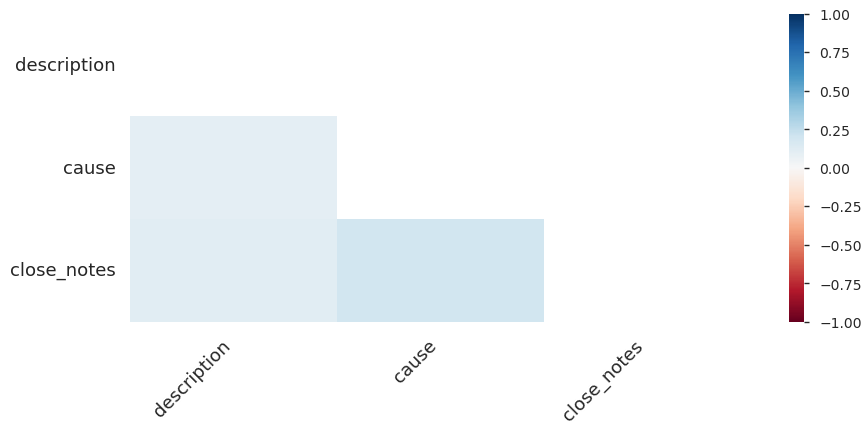

In [3]:
# For each Cluster to a Profile Report
for cluster in df['cluster'].unique():
    print(f"Cluster {cluster}")
    profile = ProfileReport(df[df['cluster'] == cluster], title=f"Profiling Report for Cluster {cluster}")
    profile.to_file(f"./html/Profiling Report for Cluster {cluster}.html")

profile = ProfileReport(df, title=f"Profiling Report")
profile.to_file(f"./html/Profiling Report for all Clusters.html")

In [18]:
# display Short Description (case), Description, Cause and close_notes
df_text = df[['description', 'cause', 'close_notes']]

# preprocess df_text columns 

display(df_text)

,description,cause,close_notes
0,notebook probleme notebook,windows,windows
1,outlook user,NaN,NaN
2,performance standort langsam per siloah,NaN,performance deaktiviert
3,microsoft,NaN,NaN
4,funktioniert programm fehlermeldung funktioniert,problem,update
...,...,...,...
11741,anmeldung vdi vdi citrix workspace app anmelde...,probleme citrix workspace app,login via
11742,drucken drucker,NaN,NaN
11743,desktop vdi geöffnet blockiert,session server,session server desktop vdi geöffnet
11744,ordner ordner,outlook problem,outlook ordner


In [19]:
def process_captions(data, column):
    data[column] = data[column].apply(lambda x: x.replace('\n', ' '))
    data[column] = data[column].apply(lambda x: x.replace('-', ' '))
    data[column] = data[column].apply(lambda x: x.lower())
    data[column] = data[column].apply(lambda x: re.sub('[^a-zA-ZäÄöÖüÜ\s]', ' ', x))
    return data[column]

# change datatype of columns to string
df_text['description'] = df_text['description'].astype(str).copy()
df_text['cause'] = df_text['cause'].astype(str).copy()
df_text['close_notes'] = df_text['close_notes'].astype(str).copy()

df_text['description'] = process_captions(df_text, 'description').copy()
df_text['cause'] = process_captions(df_text, 'cause').copy()
df_text['close_notes'] = process_captions(df_text, 'close_notes').copy()

display(df_text)

C:\Users\Student\AppData\Local\Temp\ipykernel_17980\4016132248.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['description'] = df_text['description'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_17980\4016132248.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_text['cause'] = df_text['cause'].astype(str).copy()
C:\Users\Student\AppData\Local\Temp\ipykernel_17980\4016132248.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFram

,description,cause,close_notes
0,notebook probleme notebook,windows,windows
1,outlook user,nan,nan
2,performance standort langsam per siloah,nan,performance deaktiviert
3,microsoft,nan,nan
4,funktioniert programm fehlermeldung funktioniert,problem,update
...,...,...,...
11741,anmeldung vdi vdi citrix workspace app anmelde...,probleme citrix workspace app,login via
11742,drucken drucker,nan,nan
11743,desktop vdi geöffnet blockiert,session server,session server desktop vdi geöffnet
11744,ordner ordner,outlook problem,outlook ordner


In [20]:
import requests

stopwords = requests.get("https://raw.githubusercontent.com/stopwords-iso/stopwords-de/master/stopwords-de.txt").text.split("\n")
stopwords.extend(["nan", "frau", "herr", "name", "ch", "bitte", "st", "gel", "unbekannt", "problem", "probleme", "fehler", "fehlermeldung", "funktioniert", "meldet", "meldung", "gemeldet", "starten", "gestartet", "neu", "geschlossen", "entsperrt", "gesperrt", "angerufen", "nr"])
from sklearn.feature_extraction.text import TfidfVectorizer

tfidf = TfidfVectorizer(stop_words=stopwords)
tfidf.fit(df_text['description'])
tfidf.fit(df_text['cause'])
tfidf.fit(df_text['close_notes'])

TfidfVectorizer(stop_words=['a', 'ab', 'aber', 'ach', 'acht', 'achte', 'achten',
                            'achter', 'achtes', 'ag', 'alle', 'allein', 'allem',
                            'allen', 'aller', 'allerdings', 'alles',
                            'allgemeinen', 'als', 'also', 'am', 'an', 'ander',
                            'andere', 'anderem', 'anderen', 'anderer',
                            'anderes', 'anderm', 'andern', ...])

In [21]:
# create tfidf.vocabulary_ into a dataframe 
df_tfidf = pd.DataFrame.from_dict(tfidf.vocabulary_, orient="index")
df_tfidf.sort_values(by=0, ascending=False)

index_dict = {v: k for k, v in tfidf.vocabulary_.items()}


df_tfidf = df_tfidf.reset_index()
df_tfidf.columns = ["word", "index"]
df_tfidf

top_words_i_list = []

num_top_words = 10
import tqdm
from tqdm import tqdm

for i, row in tqdm(df_text.iterrows()):

    #print("")
    #print("Ticket", i+1)
    #print("Top words per document:")
    # extract indices of top words
    top_words = sorted(
        list(enumerate(tfidf.transform([row["description"]]).toarray()[0])),
        key=lambda x: x[1],
        reverse=True,
    )[:num_top_words]

    # create empty list to store top words 
    top_words_i = []
    # print top words
    for word_index, word_score in top_words:
        #print(index_dict[word_index])
        top_words_i.append(index_dict[word_index])
    
    # append top words to top_words_i_list
    top_words_i_list.append(top_words_i)

    # break to only print first ticket
    #break

11746it [00:10, 1090.41it/s]


In [22]:
top_words_i_list[:10]

[['notebook',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app',
  'arbeiten'],
 ['outlook',
  'user',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app'],
 ['langsam',
  'standort',
  'performance',
  'siloah',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden'],
 ['aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app',
  'arbeiten',
  'benutzer'],
 ['programm',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app',
  'arbeiten'],
 ['citrix',
  'client',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app'],
 ['benutzer',
  'aare',
  'abacus',
  'account',
  'angezeigt',
  'anhang',
  'anmelden',
  'anmeldung',
  'app',
  'arbeiten'],
 ['vdi',
  'aare',
  'seite',
  'app',
  'workspace',
  'citrix',
  'abacus',
  'account',
  'angezeig

In [23]:
df_top_words = pd.DataFrame(columns=["top_10_words_each_ticket_description"])

df_top_words["top_10_words_each_ticket_description"] = top_words_i_list

df_top_words.reset_index(inplace=True)

display(df_top_words)

# rename columns
df_top_words.columns = ["number", "top_10_words_each_ticket_description"]

display(df_top_words)

,index,top_10_words_each_ticket_description
0,0,"[notebook, aare, abacus, account, angezeigt, a..."
1,1,"[outlook, user, aare, abacus, account, angezei..."
2,2,"[langsam, standort, performance, siloah, aare,..."
3,3,"[aare, abacus, account, angezeigt, anhang, anm..."
4,4,"[programm, aare, abacus, account, angezeigt, a..."
...,...,...
11741,11741,"[vdi, verbindung, anmelden, anmeldung, app, wo..."
11742,11742,"[drucken, drucker, aare, abacus, account, ange..."
11743,11743,"[blockiert, geöffnet, desktop, vdi, aare, abac..."
11744,11744,"[ordner, aare, abacus, account, angezeigt, anh..."


,number,top_10_words_each_ticket_description
0,0,"[notebook, aare, abacus, account, angezeigt, a..."
1,1,"[outlook, user, aare, abacus, account, angezei..."
2,2,"[langsam, standort, performance, siloah, aare,..."
3,3,"[aare, abacus, account, angezeigt, anhang, anm..."
4,4,"[programm, aare, abacus, account, angezeigt, a..."
...,...,...
11741,11741,"[vdi, verbindung, anmelden, anmeldung, app, wo..."
11742,11742,"[drucken, drucker, aare, abacus, account, ange..."
11743,11743,"[blockiert, geöffnet, desktop, vdi, aare, abac..."
11744,11744,"[ordner, aare, abacus, account, angezeigt, anh..."


In [24]:
# concat df with df_top_words["top_10_words_each_ticket"]
df_enhance = pd.concat([df, df_top_words["top_10_words_each_ticket_description"]], axis=1)
display(df_enhance)

,number,cluster,account,created_by_group,business_service,assignment_group,impact,priority,urgency,sla_has_breached,...,opened,closed,time_worked,openedToClosed,business_percentage,short_description,description,cause,close_notes,top_10_words_each_ticket_description
0,CS0011381,3,Saphir Group Networks AG,Unico,Managed Workplace,Service Desk 1st Level,3 - Low,4 - Low,2 - Medium,TRUE,...,2020-01-09 15:32:00,2020-05-18 19:10:46,360.0,804.900972,105.62,Herr Steiner - HP Notebook Docking Probleme,notebook probleme notebook,windows,windows,"[notebook, aare, abacus, account, angezeigt, a..."
1,CS0011690,8,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,5 - Planning,3 - Low,TRUE,...,2020-01-16 08:19:12,2020-08-19 10:30:06,360.0,804.900972,135.01,E-Mail-Archive TAB im Outlook einrichten (User...,outlook user,NaN,NaN,"[outlook, user, aare, abacus, account, angezei..."
2,CS0011797,1,Siloah AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,3 - Moderate,1 - High,TRUE,...,2020-01-20 12:26:23,2020-05-18 19:10:48,360.0,804.900972,135.01,Performance am Standort Neuhaus sehr langsam,performance standort langsam per siloah,NaN,performance deaktiviert,"[langsam, standort, performance, siloah, aare,..."
3,CS0011896,8,Interhydro AG,Unico,No Business Service - only best effort service,IT Operations,3 - Low,5 - Planning,3 - Low,TRUE,...,2020-01-21 18:18:46,2020-06-23 14:51:27,900.0,804.900972,135.01,Cloudberry Backup: HV002-monthly failed,microsoft,NaN,NaN,"[aare, abacus, account, angezeigt, anhang, anm..."
4,CS0012000,7,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,Service Desk 2nd Level,3 - Low,4 - Low,2 - Medium,TRUE,...,2020-01-23 17:09:10,2020-05-18 19:10:49,360.0,804.900972,135.01,Pay Pen funktioniert nicht im Programm SAGE,funktioniert programm fehlermeldung funktioniert,problem,update,"[programm, aare, abacus, account, angezeigt, a..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11741,CS0076818,6,Siloah AG,Unico,Anmeldeprobleme auf Hosted Desktop beheben (Pa...,Squad Platform,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,2024-02-10 07:48:59,2024-02-19 22:30:09,2700.0,230.686111,0.03,"Luana Filippi, Anmeldung VDI nicht möglich",anmeldung vdi vdi citrix workspace app anmelde...,probleme citrix workspace app,login via,"[vdi, verbindung, anmelden, anmeldung, app, wo..."
11742,CS0076821,6,Siloah AG,Unico,Übrige Störungen und Anfragen Hosted Desktop,Vorortsupport Siloah,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,2024-02-12 05:57:13,2024-02-19 22:30:10,3240.0,184.549167,4.59,"Nagaratnam Thavaraja - drucken Drucker ""prt-C1...",drucken drucker,NaN,NaN,"[drucken, drucker, aare, abacus, account, ange..."
11743,CS0076822,6,PB Swiss Tools,Unico,Session freigeben in Hosted Desktop,Service Desk 1st Level,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,2024-02-12 06:06:02,2024-02-19 22:30:10,900.0,184.402222,1.80,Parthiban Nathan - Desktop VDI kann nicht mehr...,desktop vdi geöffnet blockiert,session server,session server desktop vdi geöffnet,"[blockiert, geöffnet, desktop, vdi, aare, abac..."
11744,CS0076849,6,Siloah AG,Unico,Applikationsstörung (Standard Applikation) beh...,Service Desk 1st Level,2 - Medium,3 - Moderate,2 - Medium,FALSE,...,2024-02-12 13:08:42,2024-02-19 22:30:14,720.0,177.358889,0.04,"Christian Kunz, Fehlender Archiv ordner",ordner ordner,outlook problem,outlook ordner,"[ordner, aare, abacus, account, angezeigt, anh..."


In [25]:
vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)
print(vorcab)

# convert into datafarme
df_vorcab = pd.DataFrame(vorcab)
df_vorcab.columns = ["top_10_words_each_ticket_description"]
display(df_vorcab)

# count values
df_vorcab["top_10_words_each_ticket_description"].value_counts().head(50)

[['notebook']
 ['aare']
 ['abacus']
 ...
 ['anhang']
 ['anmelden']
 ['anmeldung']]


,top_10_words_each_ticket_description
0,notebook
1,aare
2,abacus
3,account
4,angezeigt
...,...
117455,account
117456,angezeigt
117457,anhang
117458,anmelden


top_10_words_each_ticket_description
aare          11517
abacus        11433
account       11344
angezeigt     11212
anhang        10977
anmelden      10531
anmeldung      9573
app            7655
arbeiten       4837
vdi            2050
benutzer       1991
desktop        1471
login           986
outlook         875
citrix          838
drucker         705
user            667
verbindung      608
pc              590
unico           540
server          528
passwort        502
session         459
betreff         438
zugriff         428
öffnen          427
erscheint       420
geöffnet        415
system          407
standort        399
büro            399
siloah          390
hosted          385
startet         376
konto           371
id              361
etc             352
lässt           349
mails           323
support         301
gerät           295
einloggen       293
leider          291
elim            281
client          279
igel            271
drucken         250
cs              244
bil

In [26]:
important_words_df = pd.DataFrame(df_vorcab["top_10_words_each_ticket_description"].value_counts()).reset_index()  

df_top = df['number']
top50words = important_words_df.index[:50].tolist()

# onehot encoding df_enhance["top_10_words_each_ticket"] with top50words
for word in top50words:

    df_enhance[word] = df_enhance["top_10_words_each_ticket_description"].apply(lambda x: 1 if word in x else 0)

display(df_enhance.head(10))

,number,cluster,account,created_by_group,business_service,assignment_group,impact,priority,urgency,sla_has_breached,...,40,41,42,43,44,45,46,47,48,49
0,CS0011381,3,Saphir Group Networks AG,Unico,Managed Workplace,Service Desk 1st Level,3 - Low,4 - Low,2 - Medium,TRUE,...,0,0,0,0,0,0,0,0,0,0
1,CS0011690,8,GASSMANN Rechtsanwälte AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,5 - Planning,3 - Low,TRUE,...,0,0,0,0,0,0,0,0,0,0
2,CS0011797,1,Siloah AG,Unico,Hosted Desktop,Service Desk 1st Level,3 - Low,3 - Moderate,1 - High,TRUE,...,0,0,0,0,0,0,0,0,0,0
3,CS0011896,8,Interhydro AG,Unico,No Business Service - only best effort service,IT Operations,3 - Low,5 - Planning,3 - Low,TRUE,...,0,0,0,0,0,0,0,0,0,0
4,CS0012000,7,Verband Regionaler SD Münchenbuchsee,User,No Business Service - only best effort service,Service Desk 2nd Level,3 - Low,4 - Low,2 - Medium,TRUE,...,0,0,0,0,0,0,0,0,0,0
5,CS0012311,2,Schilthornbahn AG,Unico,No Business Service - only best effort service,IT Operations,3 - Low,4 - Low,2 - Medium,FALSE,...,0,0,0,0,0,0,0,0,0,0
6,CS0012381,3,Schilthornbahn AG,Unico,No Business Service - only best effort service,Service Desk 2nd Level,3 - Low,4 - Low,2 - Medium,FALSE,...,0,0,0,0,0,0,0,0,0,0
7,CS0012457,2,Shoppi Tivoli Management AG,Unico,Hosted Desktop,Squad Platform,3 - Low,4 - Low,2 - Medium,TRUE,...,0,0,0,0,0,0,0,0,0,0
8,CS0012461,2,SAHB,Unico,Hosted Desktop,IT Operations,3 - Low,4 - Low,2 - Medium,FALSE,...,0,0,0,0,0,0,0,0,0,0
9,CS0012477,8,Unico Treuhand AG,Unico,Hosted Desktop,IT Operations,3 - Low,5 - Planning,3 - Low,FALSE,...,0,0,0,0,0,0,0,0,0,0


Top20 words for business_service


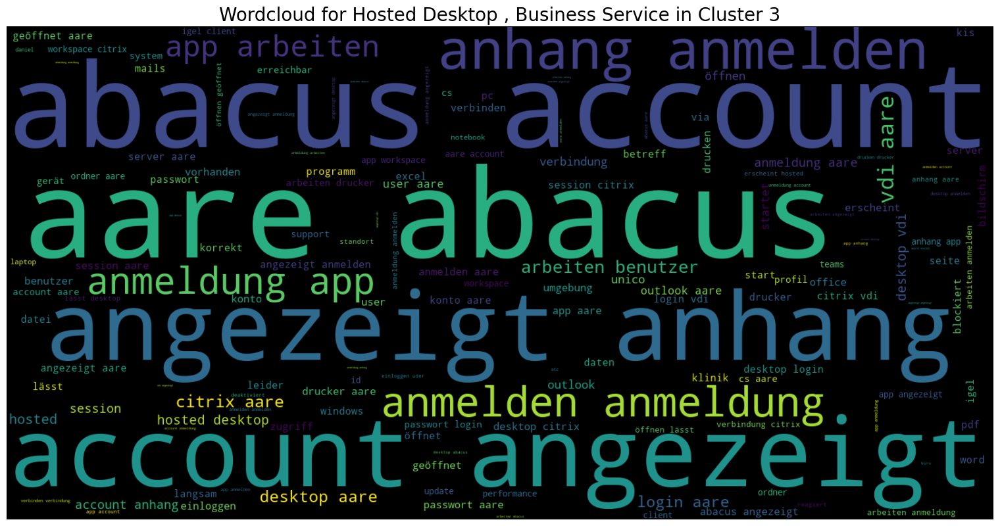

Cluster: 3 for BS:  Hosted Desktop


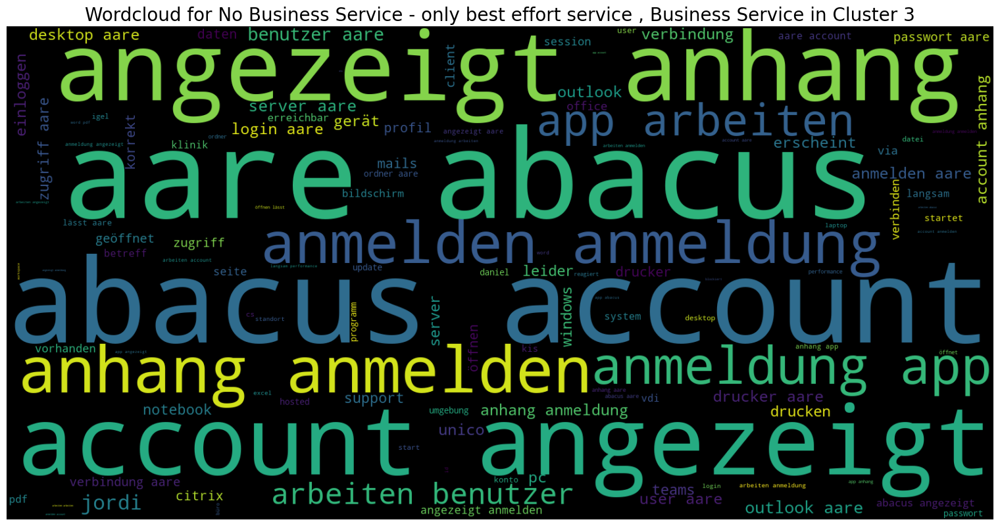

Cluster: 3 for BS:  No Business Service - only best effort service


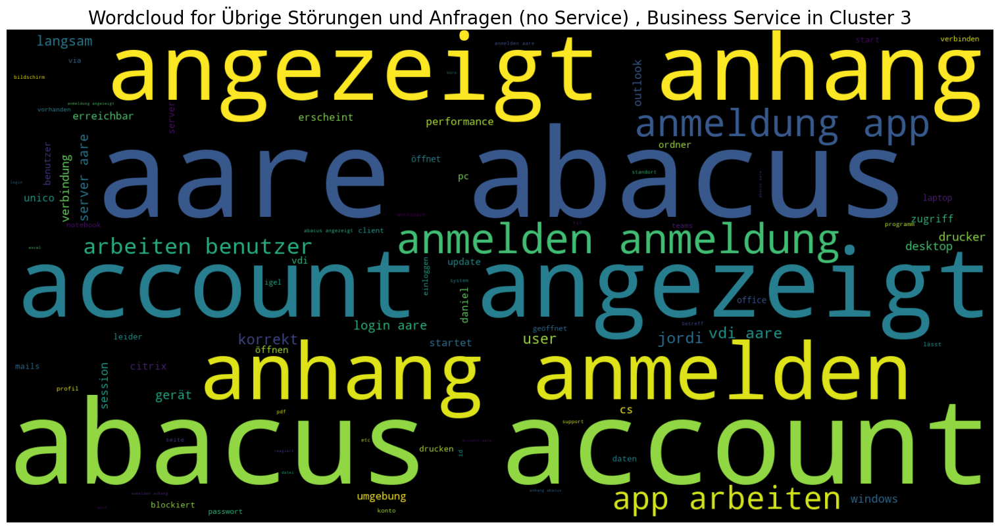

Cluster: 3 for BS:  Übrige Störungen und Anfragen (no Service)


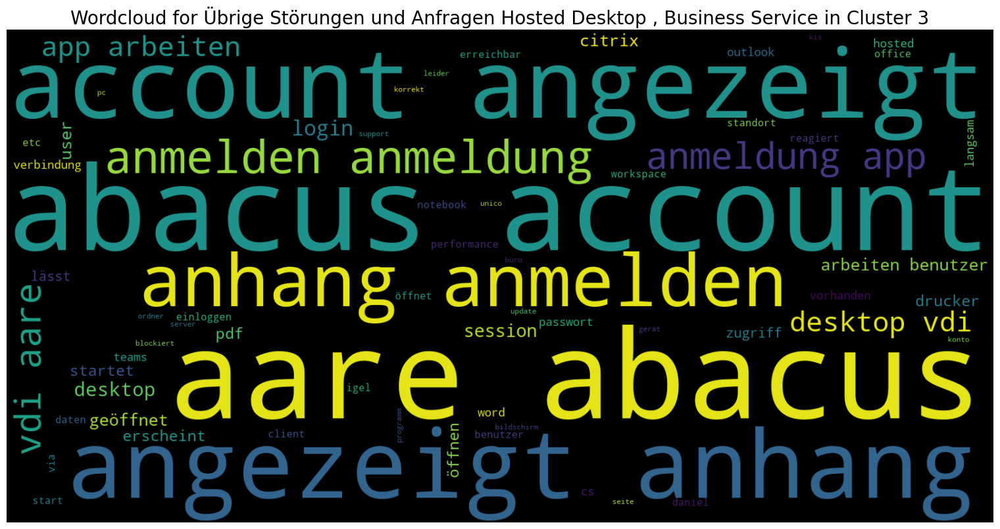

Cluster: 3 for BS:  Übrige Störungen und Anfragen Hosted Desktop


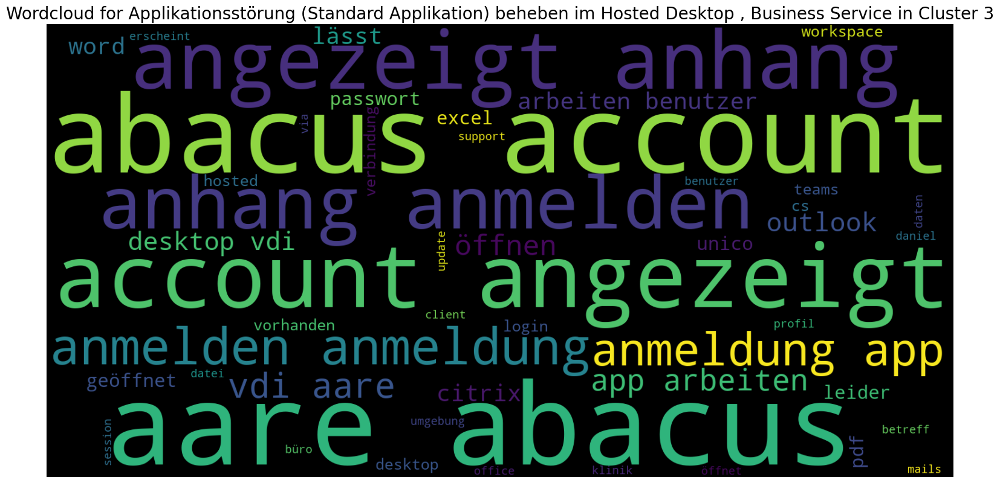

Cluster: 3 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


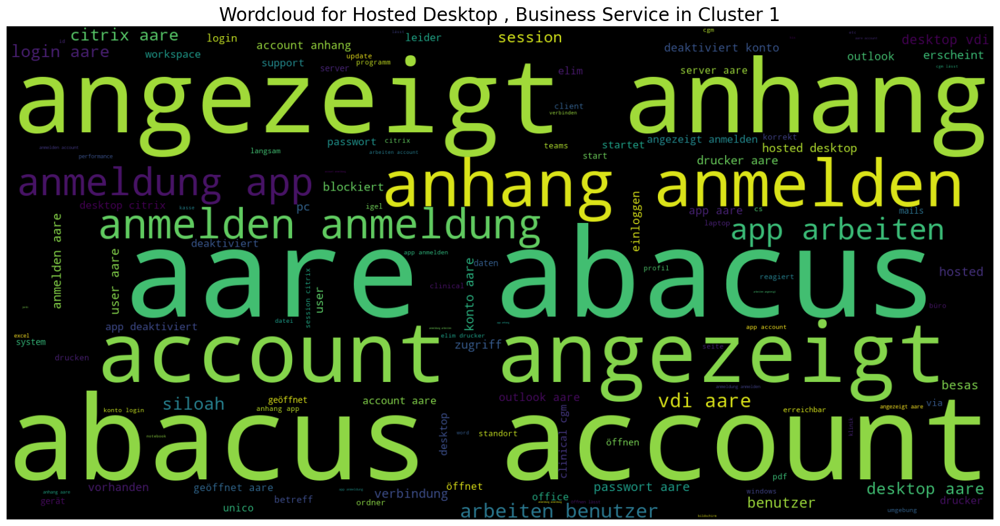

Cluster: 1 for BS:  Hosted Desktop


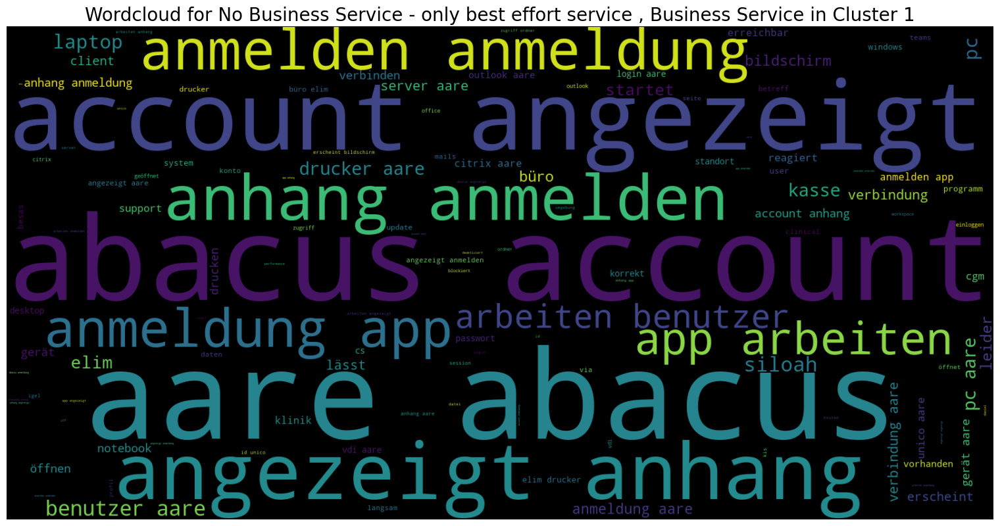

Cluster: 1 for BS:  No Business Service - only best effort service


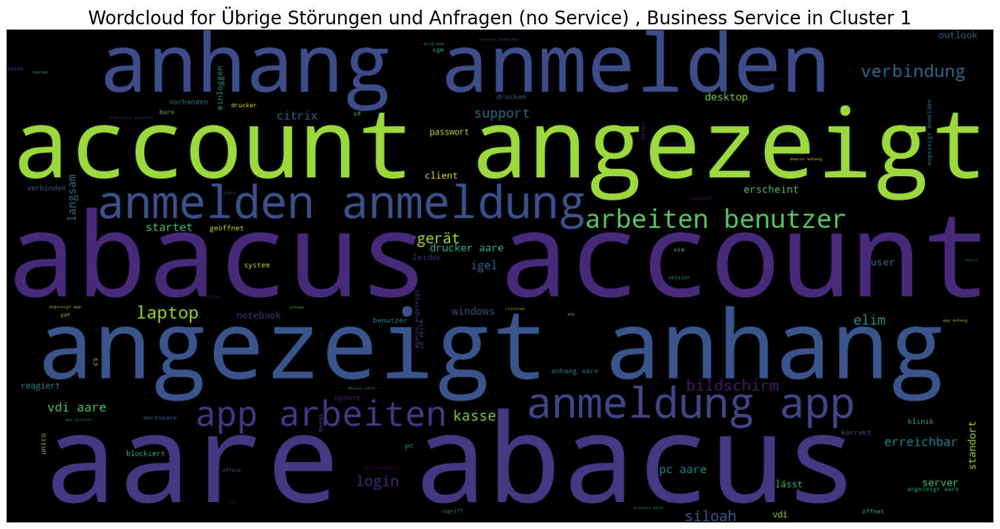

Cluster: 1 for BS:  Übrige Störungen und Anfragen (no Service)


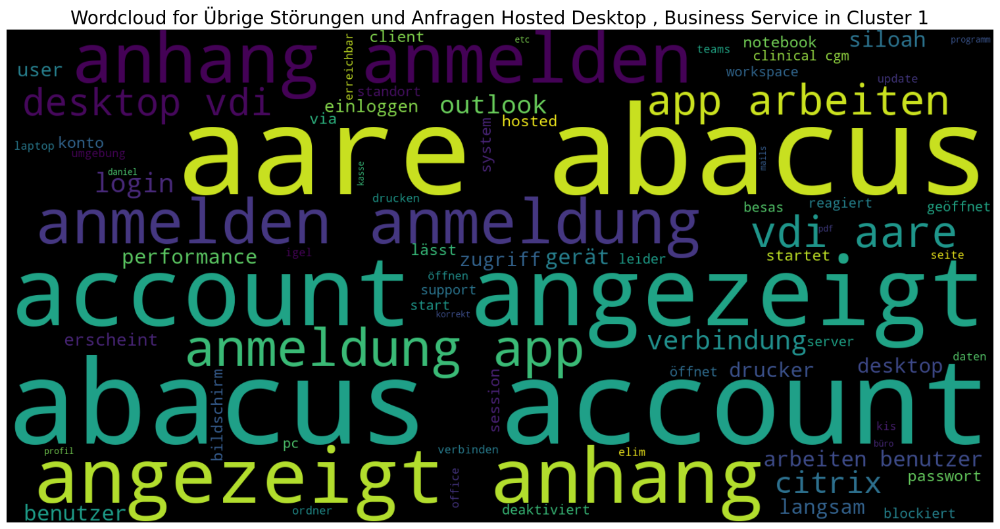

Cluster: 1 for BS:  Übrige Störungen und Anfragen Hosted Desktop


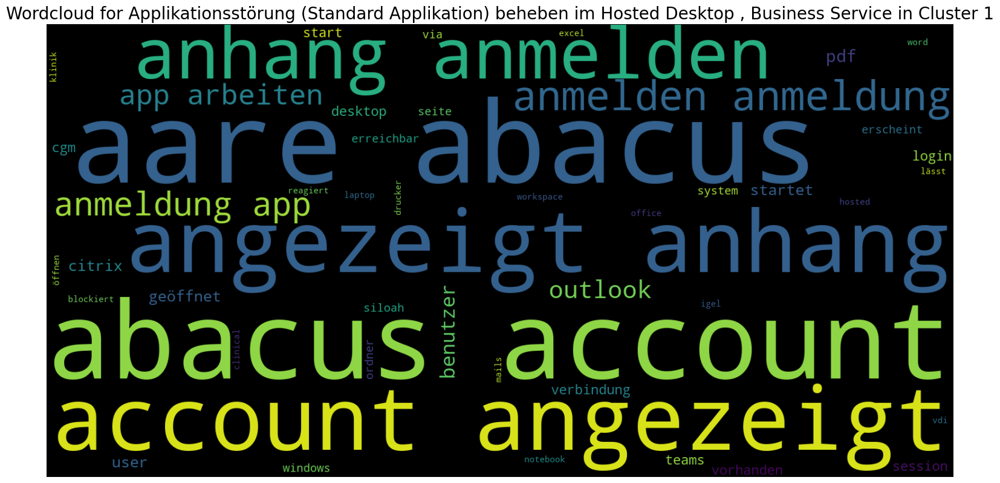

Cluster: 1 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


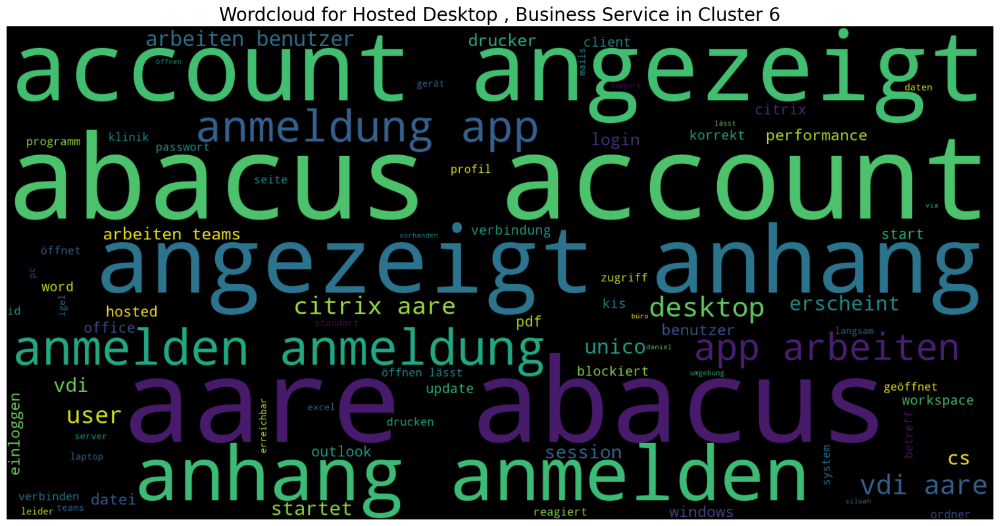

Cluster: 6 for BS:  Hosted Desktop


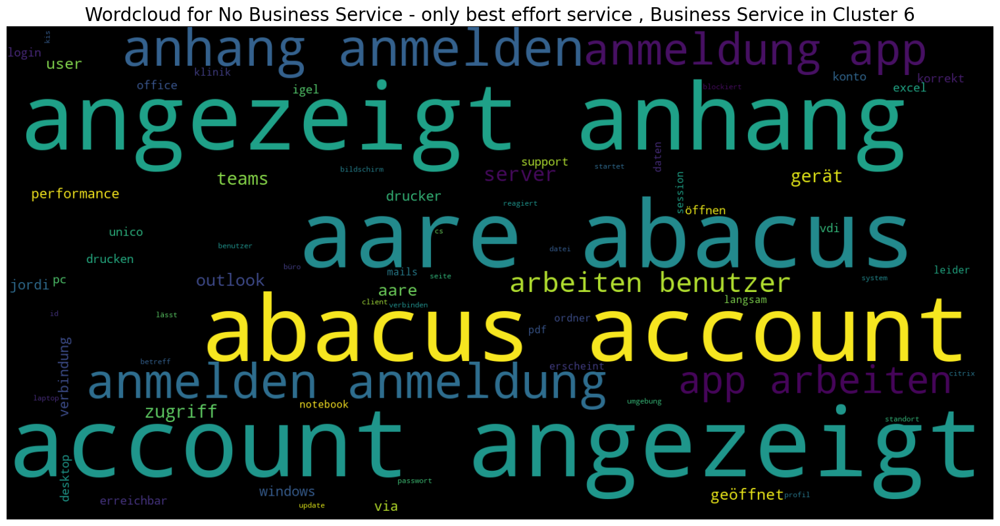

Cluster: 6 for BS:  No Business Service - only best effort service


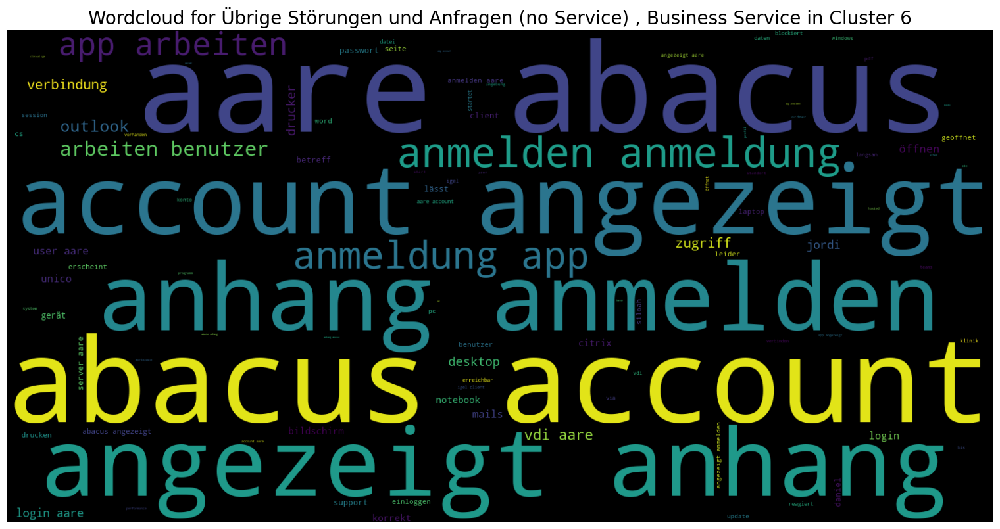

Cluster: 6 for BS:  Übrige Störungen und Anfragen (no Service)


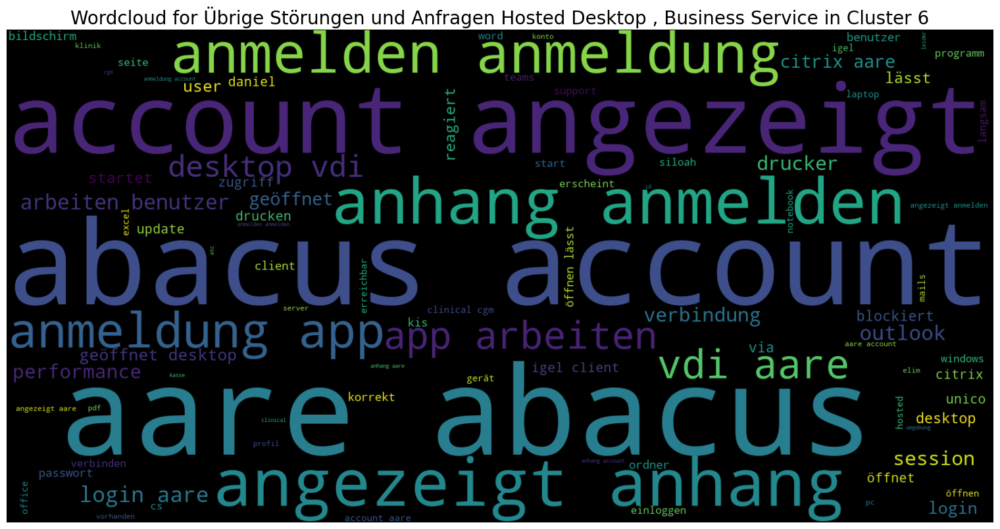

Cluster: 6 for BS:  Übrige Störungen und Anfragen Hosted Desktop


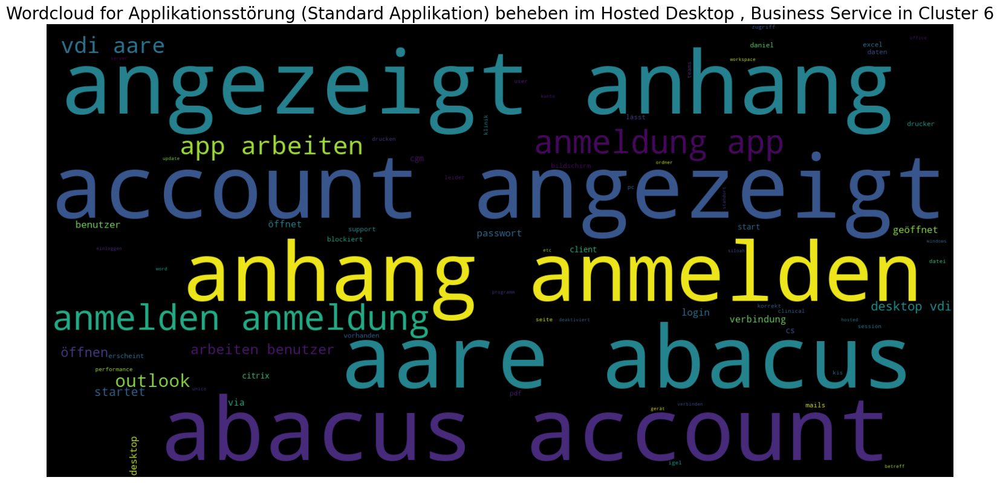

Cluster: 6 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


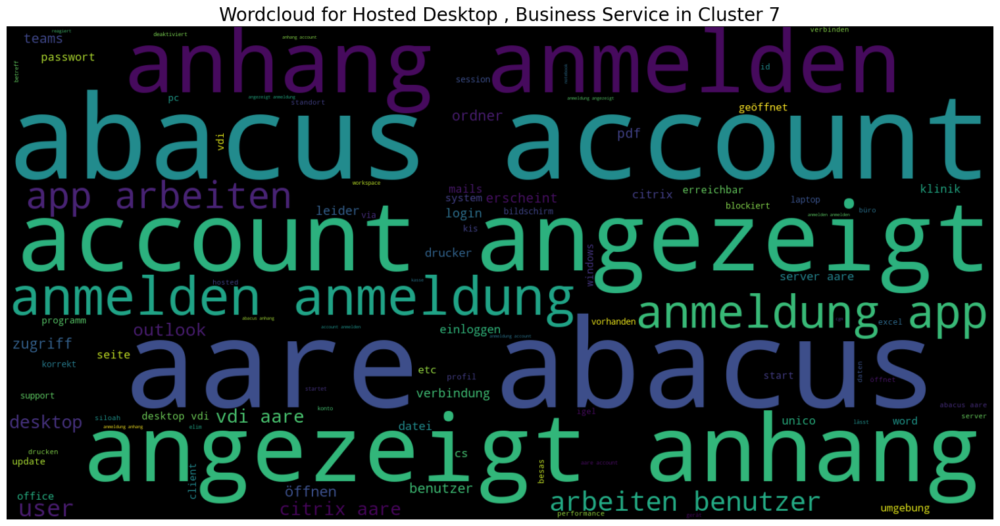

Cluster: 7 for BS:  Hosted Desktop


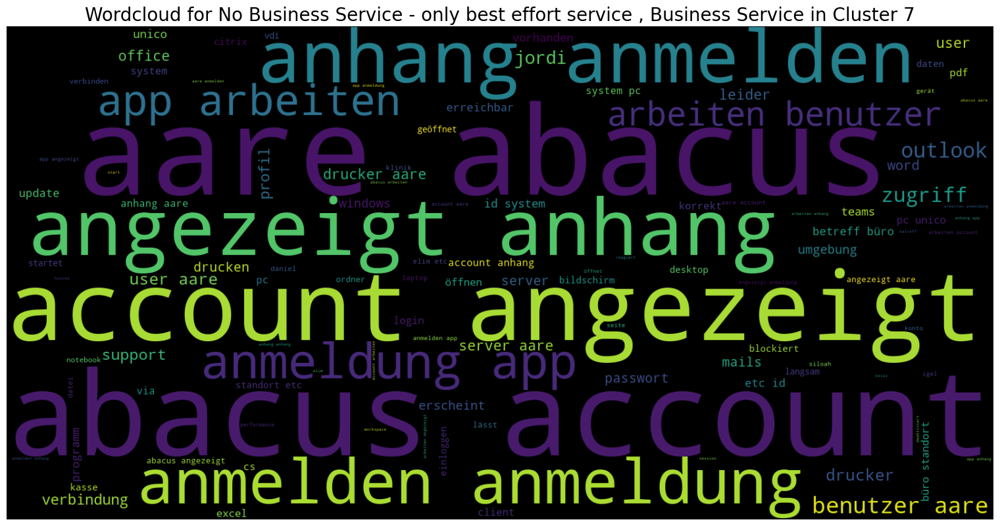

Cluster: 7 for BS:  No Business Service - only best effort service


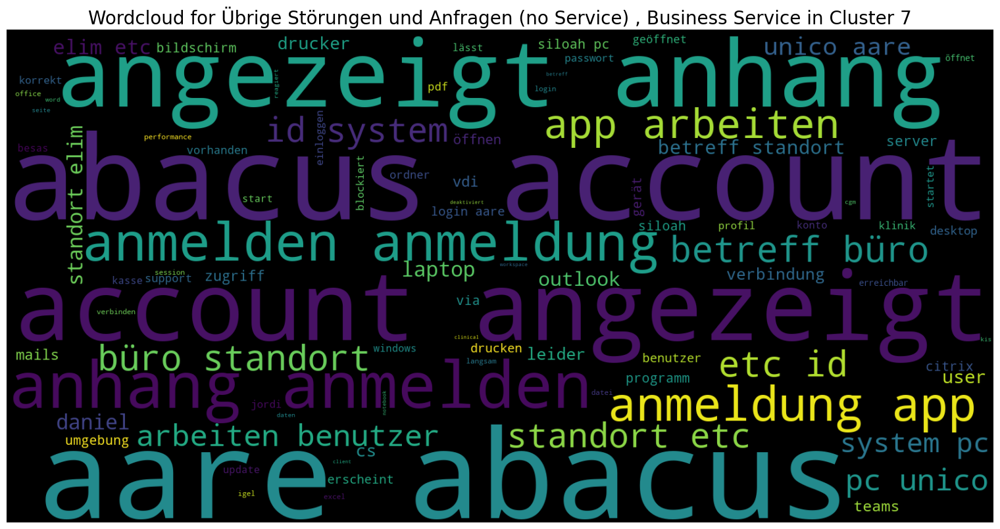

Cluster: 7 for BS:  Übrige Störungen und Anfragen (no Service)


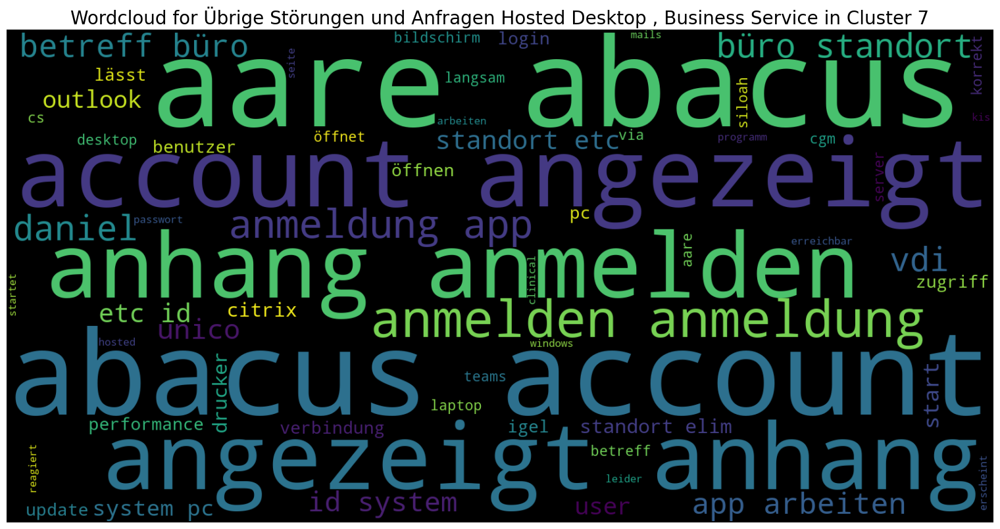

Cluster: 7 for BS:  Übrige Störungen und Anfragen Hosted Desktop


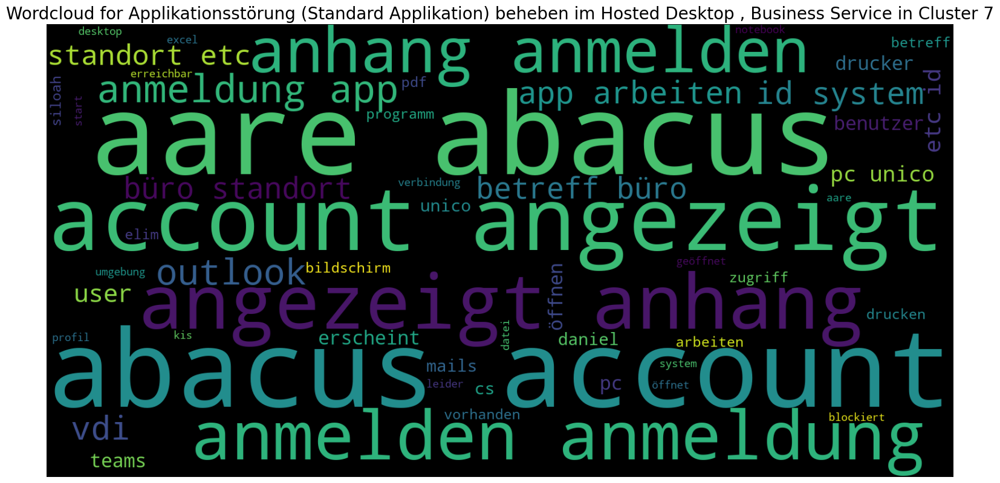

Cluster: 7 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


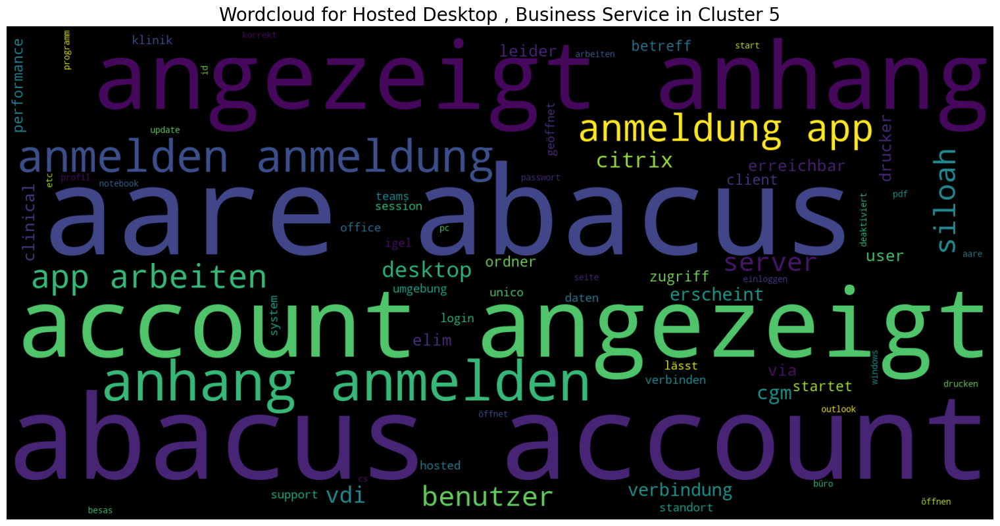

Cluster: 5 for BS:  Hosted Desktop


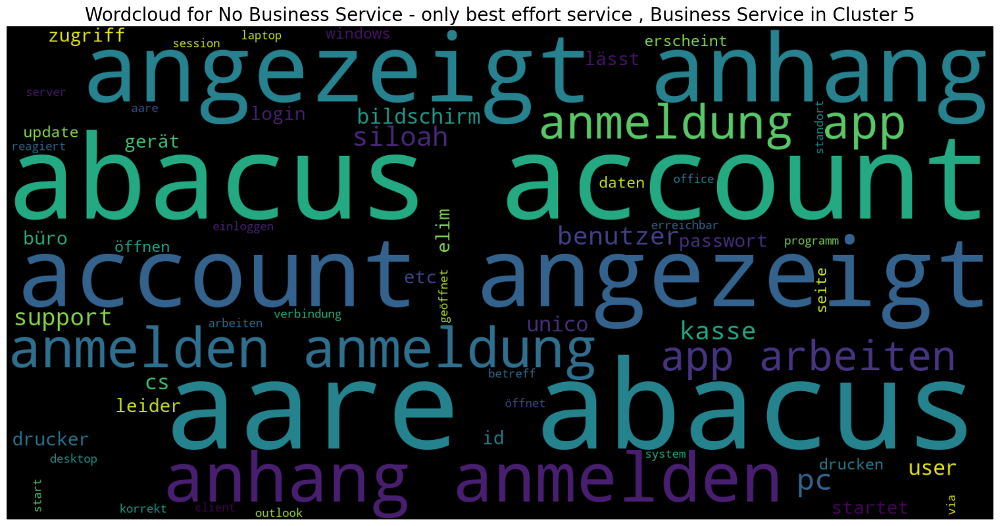

Cluster: 5 for BS:  No Business Service - only best effort service


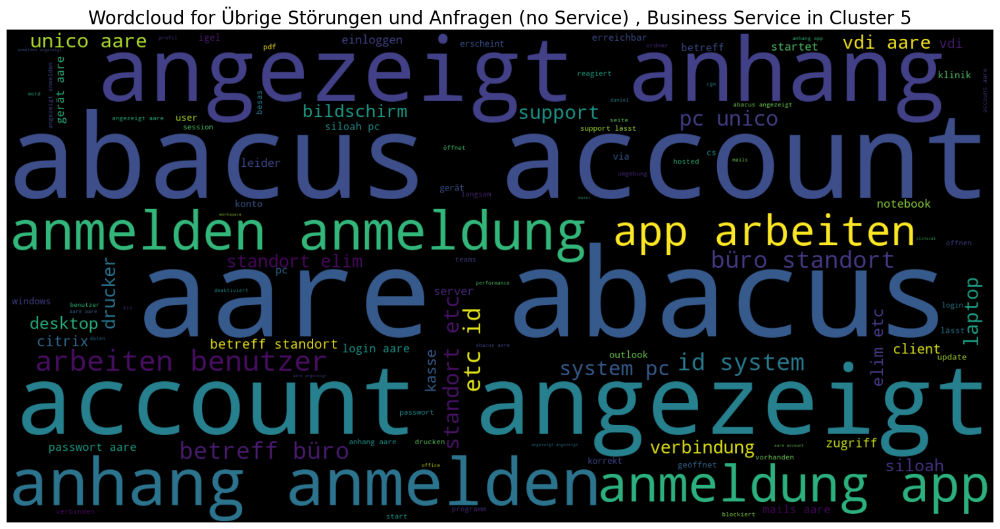

Cluster: 5 for BS:  Übrige Störungen und Anfragen (no Service)


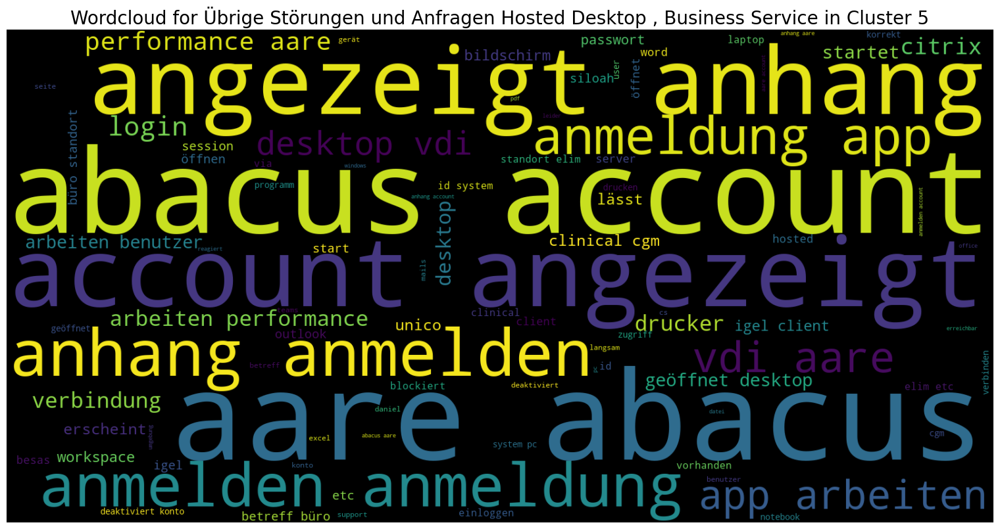

Cluster: 5 for BS:  Übrige Störungen und Anfragen Hosted Desktop


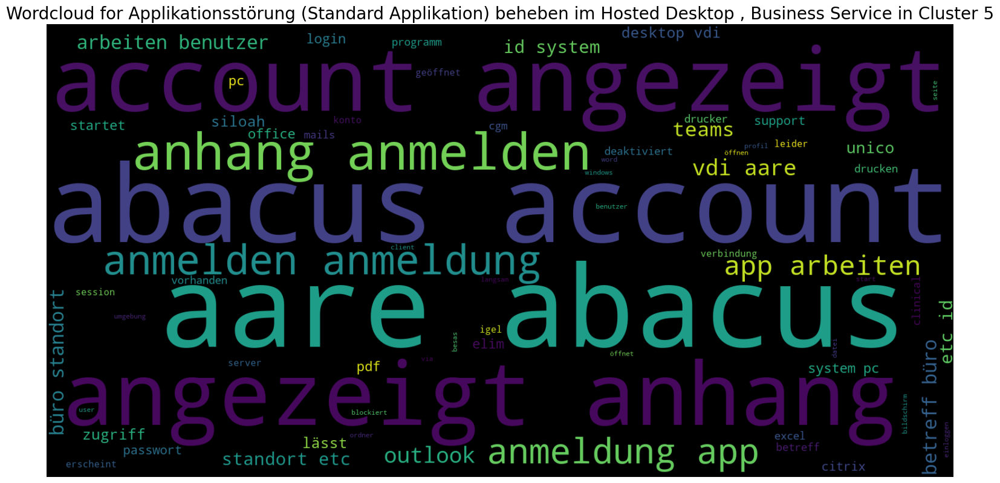

Cluster: 5 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


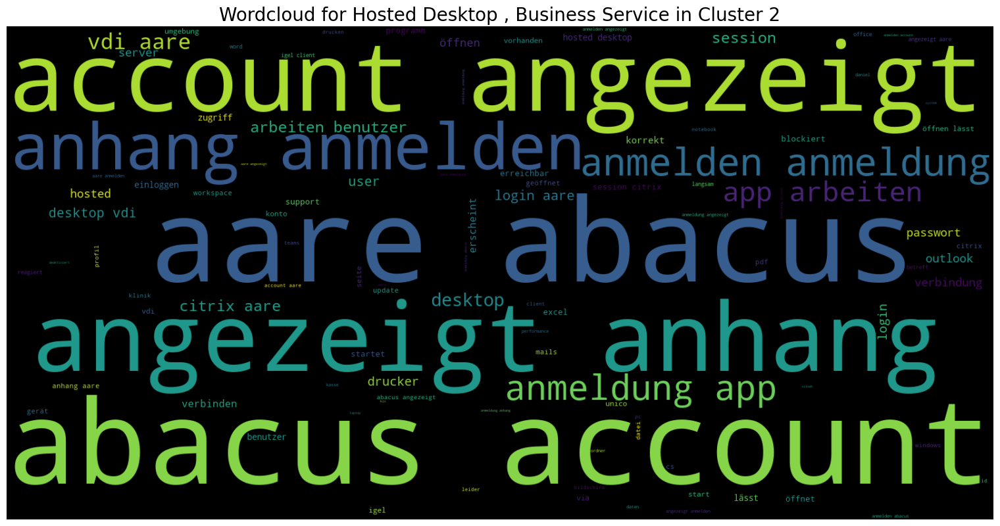

Cluster: 2 for BS:  Hosted Desktop


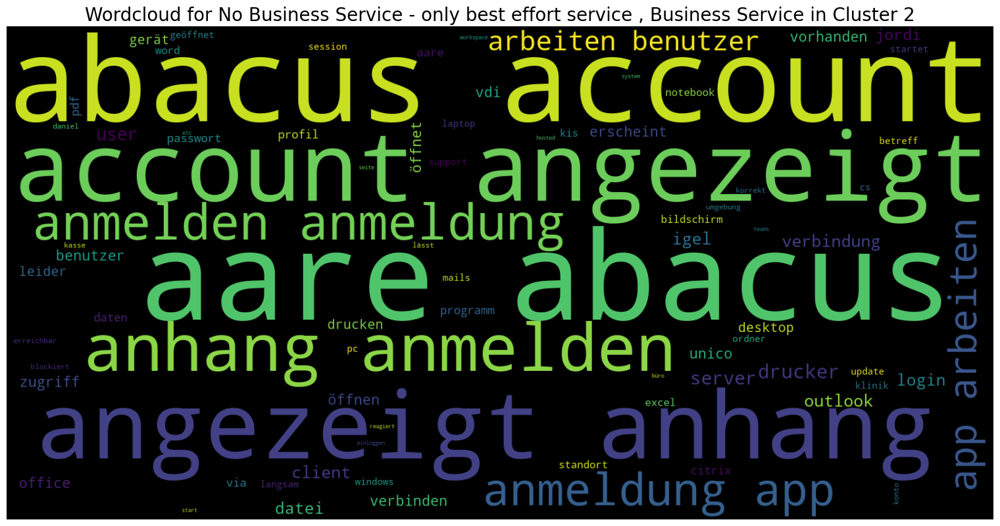

Cluster: 2 for BS:  No Business Service - only best effort service


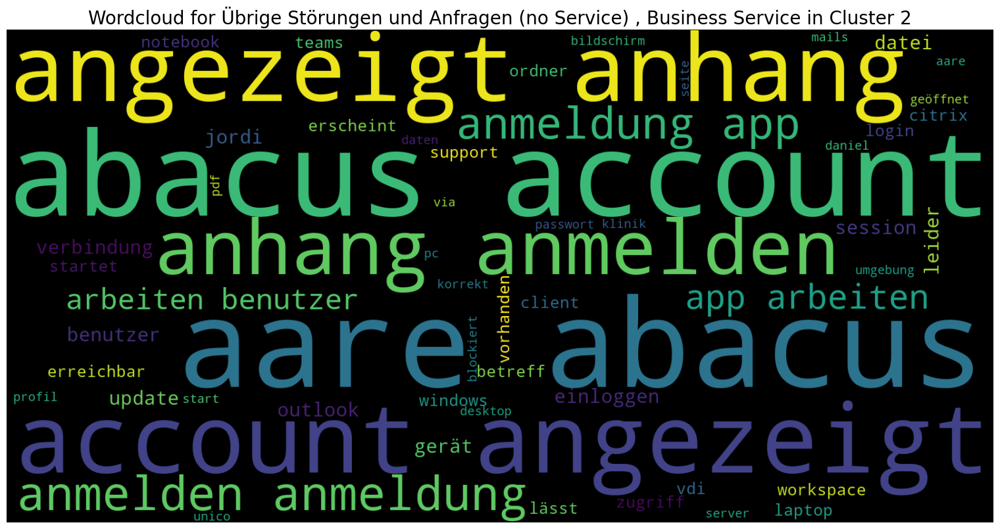

Cluster: 2 for BS:  Übrige Störungen und Anfragen (no Service)


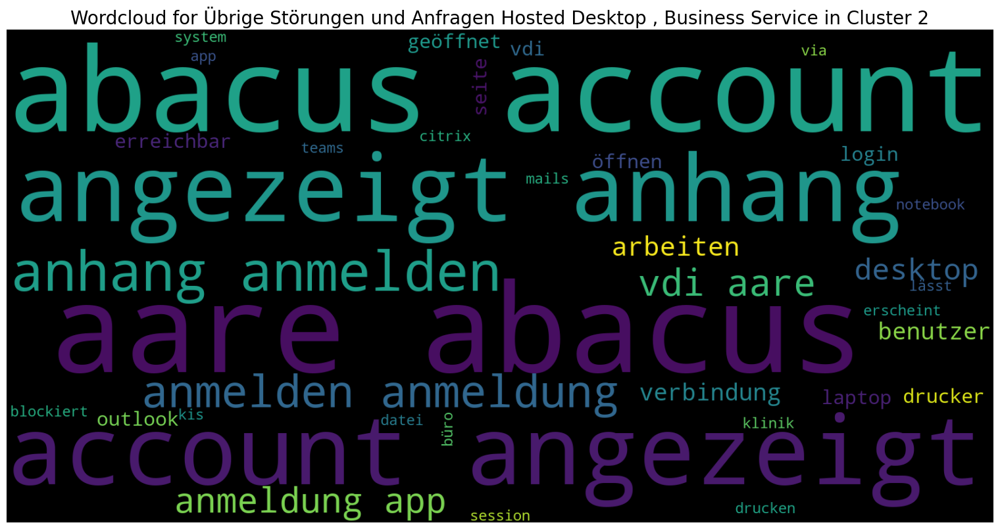

Cluster: 2 for BS:  Übrige Störungen und Anfragen Hosted Desktop


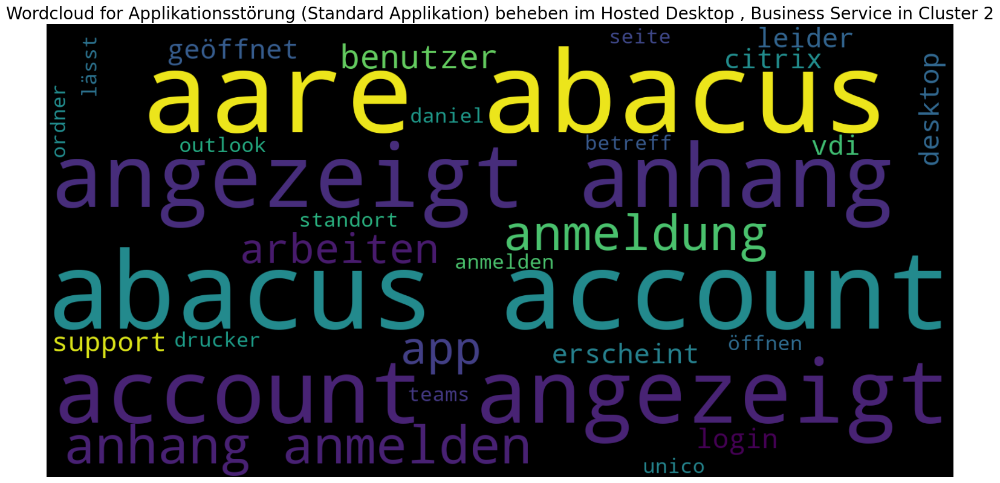

Cluster: 2 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


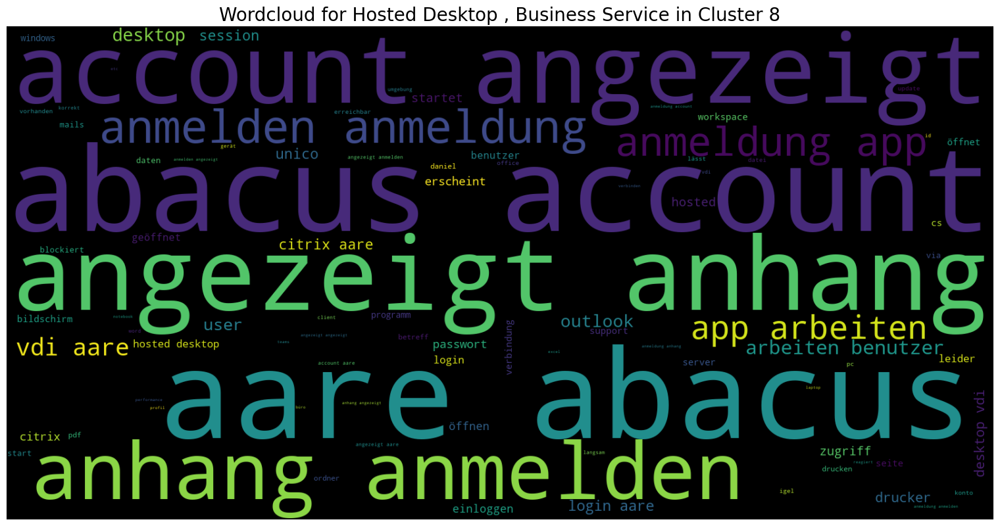

Cluster: 8 for BS:  Hosted Desktop


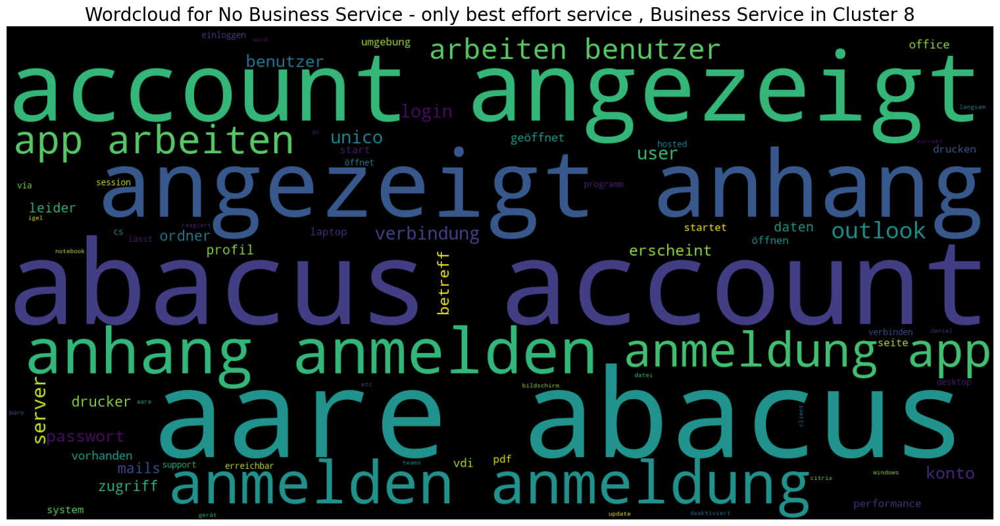

Cluster: 8 for BS:  No Business Service - only best effort service


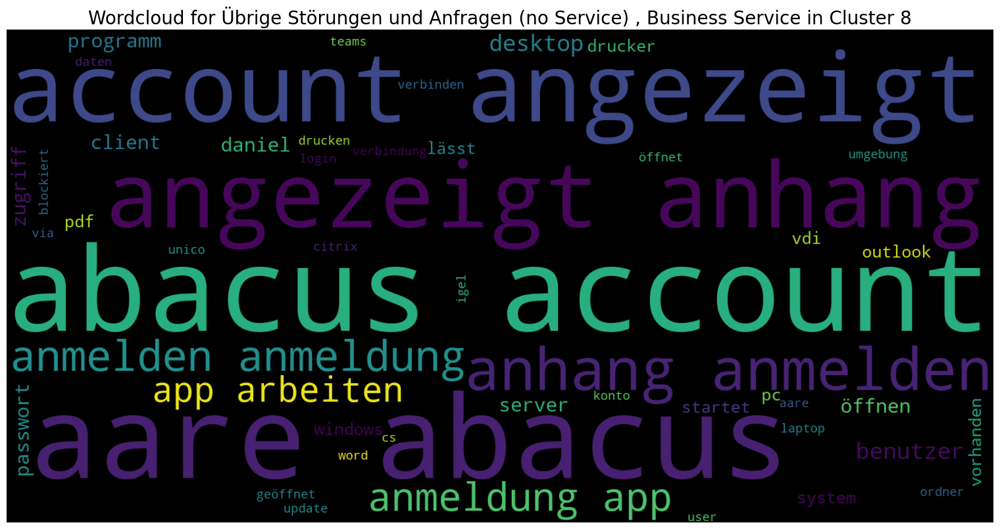

Cluster: 8 for BS:  Übrige Störungen und Anfragen (no Service)


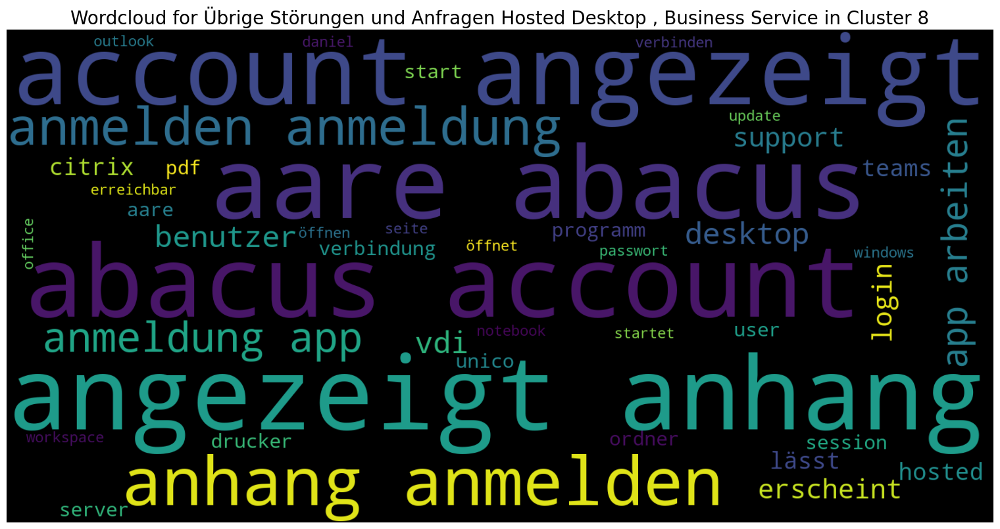

Cluster: 8 for BS:  Übrige Störungen und Anfragen Hosted Desktop


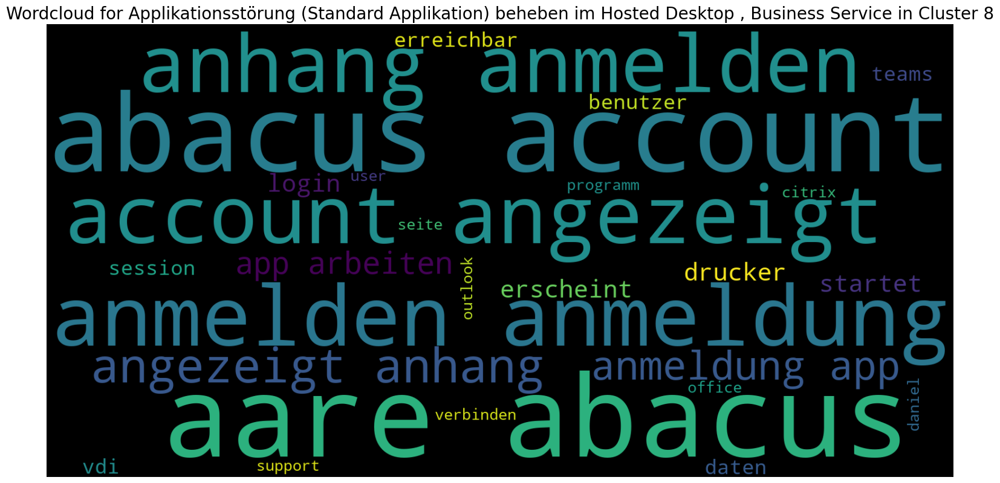

Cluster: 8 for BS:  Applikationsstörung (Standard Applikation) beheben im Hosted Desktop


In [27]:
def create_wordclouds(df, clusterFilter = None, businessServiceFilter = None, plot_worldcloud=False):
    '''
    param df: dataframe (df_enhance = pd.read_parquet('Daten/Top50Words_OneHot_DataFrame.parquet'))
    clusterFilter: int (example: "1")
    businessServiceFilter: string (example: "skype")
    plot_worldcloud: boolean (default: False)
    
    '''

    # create copy of df
    df_enhance = df.copy()

    # filter for Clusterfilter
    if clusterFilter != None:
        df_enhance = df_enhance[df_enhance["cluster"] == clusterFilter]
    else:
        pass

    # filter for serviceangebotfilter
    if businessServiceFilter != None:
        df_enhance = df_enhance[df_enhance["business_service"] == businessServiceFilter]
    else:
        pass
    

    # filter from df the top 10 words each ticket and turn into list 
    vorcab = np.array(df_enhance["top_10_words_each_ticket_description"].to_list()).reshape(-1, 1)

    # convert vorcab into DataFrame
    df_vorcab = pd.DataFrame(vorcab)
    # rename column from new created dataframe
    df_vorcab.columns = ["top_10_words_each_ticket_description"]

    # filter with regex, not numbers 
    df_vorcab = df_vorcab[(df_vorcab["top_10_words_each_ticket_description"].str.contains(r'[0-9]') == False)]
    # filter with regex, if none remove
    df_vorcab = df_vorcab[df_vorcab["top_10_words_each_ticket_description"] != "none"]

    worldclouds_list = df_vorcab["top_10_words_each_ticket_description"].to_list()  

    # create with worldclouds_list a string a worldcloud
    worldclouds_string = " ".join(worldclouds_list)

    # create wordcloud
    wordcloud = WordCloud(width=1600, height=800, max_font_size=200).generate(worldclouds_string)

    if plot_worldcloud:
        # plot wordcloud
        # set to white background
        # add title 

        plt.figure(figsize=(15,20), facecolor='white', edgecolor='blue')
        plt.imshow(wordcloud, interpolation='bilinear')
        plt.title(f"Wordcloud for {businessServiceFilter} , Business Service in Cluster {clusterFilter}" , fontsize=20)
        plt.axis("off")
        plt.tight_layout(pad=0)
        plt.show()
        # save wordcloud as png
        # import re
        import re
        print(f"Cluster: {clusterFilter} for BS:  {businessServiceFilter}")
        # replace everhy non character with _ in serviceangebotfilter
        businessServiceFilter_string = re.sub(r'\W+', '', businessServiceFilter)
        wordcloud.to_file(f"wordcloud/Cluster{clusterFilter}_{businessServiceFilter_string}.png")


print("Top20 words for business_service")
df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list()

# iterate through top 20 serviceangebot
for cluster in df_enhance.cluster.value_counts().reset_index().iloc[:7, 0].to_list():
    for business_service in df_enhance.business_service.value_counts().reset_index().iloc[:5, 0].to_list():
        create_wordclouds(df_enhance, clusterFilter=cluster, businessServiceFilter=business_service, plot_worldcloud=True)
        # export wordclouds as png  

In [28]:
test = str(df.cluster[0])
print(type(test))
print(str(df.cluster[:10]))

<class 'str'>
0    3
1    8
2    1
3    8
4    7
5    2
6    3
7    2
8    2
9    8
Name: cluster, dtype: int32
